In [ ]:
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
import nltk
import string
from nltk.classify import NaiveBayesClassifier
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
data_set= pd.read_csv('/content/mbti_1.csv')
data_set.tail()

,type,posts
8670,ISFP,'https://www.youtube.com/watch?v=t8edHB_h908||...
8671,ENFP,'So...if this thread already exists someplace ...
8672,INTP,'So many questions when i do these things. I ...
8673,INFP,'I am very conflicted right now when it comes ...
8674,INFP,'It has been too long since I have been on per...


In [ ]:
data_set.isnull().any()

type     False
posts    False
dtype: bool

In [ ]:
data_set.shape

(8675, 2)

In [ ]:
data_set.iloc[0,1].split('|||')

["'http://www.youtube.com/watch?v=qsXHcwe3krw",
 'http://41.media.tumblr.com/tumblr_lfouy03PMA1qa1rooo1_500.jpg',
 'enfp and intj moments  https://www.youtube.com/watch?v=iz7lE1g4XM4  sportscenter not top ten plays  https://www.youtube.com/watch?v=uCdfze1etec  pranks',
 'What has been the most life-changing experience in your life?',
 'http://www.youtube.com/watch?v=vXZeYwwRDw8   http://www.youtube.com/watch?v=u8ejam5DP3E  On repeat for most of today.',
 'May the PerC Experience immerse you.',
 'The last thing my INFJ friend posted on his facebook before committing suicide the next day. Rest in peace~   http://vimeo.com/22842206',
 "Hello ENFJ7. Sorry to hear of your distress. It's only natural for a relationship to not be perfection all the time in every moment of existence. Try to figure the hard times as times of growth, as...",
 '84389  84390  http://wallpaperpassion.com/upload/23700/friendship-boy-and-girl-wallpaper.jpg  http://assets.dornob.com/wp-content/uploads/2010/04/round-ho

In [ ]:
len(data_set.iloc[1,1].split('|||'))

50

In [ ]:
types = np.unique(np.array(data_set['type']))
types=list(types)

In [ ]:
total = data_set.groupby(['type']).count()*50
total

,posts
type,
ENFJ,9500
ENFP,33750
ENTJ,11550
ENTP,34250
ESFJ,2100
ESFP,2400
ESTJ,1950
ESTP,4450
INFJ,73500


Text(0.5, 1.0, 'Total posts for each personality type')

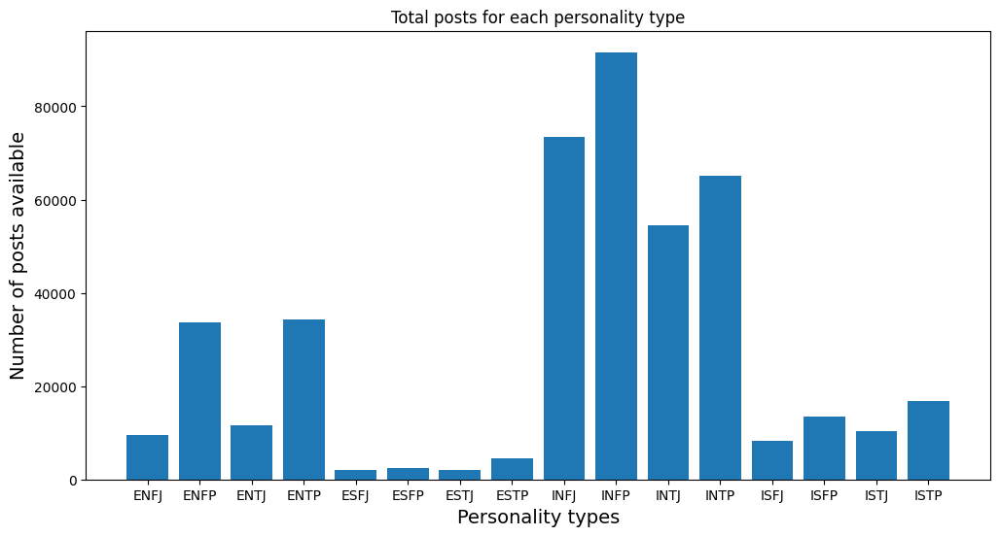

In [ ]:
plt.figure(figsize = (12,6))
plt.bar(np.array(total.index), height = total['posts'],)
plt.xlabel('Personality types', size = 14)
plt.ylabel('Number of posts available', size = 14)
plt.title('Total posts for each personality type')

In [ ]:
data_set=pd.read_csv('/content/mbti_1.csv')

In [ ]:
def preprocess_text(df, remove_special=True):
    texts = df['posts'].copy()
    labels = df['type'].copy()

    df["posts"] = df["posts"].apply(lambda x: re.sub(r'https?:\/\/.*?[\s+]', '',x))

    df["posts"] = df["posts"].apply(lambda x: re.sub(r'[\.+]', ".",x))

    df["posts"] = df["posts"].apply(lambda x: re.sub(r'[^\w\s|]','',x))

    df["posts"] = df["posts"].apply(lambda x: re.sub(r'[0-9]','',x))

    df["posts"] = df["posts"].apply(lambda x: x.lower())

    df["posts"] = df["posts"].apply(lambda x: re.sub(r'([a-z])\1{2,}[\s|\w]*','',x))

    df["posts"] = df["posts"].apply(lambda x: re.sub(r'(\b\w{0,3})?\b','',x))
    df["posts"] = df["posts"].apply(lambda x: re.sub(r'(\b\w{30,1000})?\b','',x))

    if remove_special:
        pers_types = ['INFP' ,'INFJ', 'INTP', 'INTJ', 'ENTP', 'ENFP', 'ISTP' ,'ISFP' ,'ENTJ', 'ISTJ','ENFJ', 'ISFJ' ,'ESTP', 'ESFP' ,'ESFJ' ,'ESTJ']
        pers_types = [p.lower() for p in pers_types]
        pattern = '|'.join(map(re.escape, pers_types))
        df["posts"] = df["posts"].apply(lambda x: re.sub(pattern,'',x))

    return df

new_df = preprocess_text(data_set)

In [ ]:
data_set.tail()

,type,posts
8670,ISFP,just because always think cats doms some ...
8671,ENFP,soif this thread already exists someplace else...
8672,INTP,many questions when these things would ta...
8673,INFP,very conflicted right when comes wanting ...
8674,INFP,been long since have been personalitycafe...


In [ ]:
all_posts= pd.DataFrame()
for j in types:
    temp1 = data_set[data_set['type']==j]['posts']
    temp2 = []
    for i in temp1:
        temp2+=i.split('|||')
    temp3 = pd.Series(temp2)
    all_posts[j] = temp3

all_posts.tail()

,ENFJ,ENFP,ENTJ,ENTP,ESFJ,ESFP,ESTJ,ESTP,INFJ,INFP,INTJ,INTP,ISFJ,ISFP,ISTJ,ISTP
5390,very particular have dated certain girls ...,thats fascinating wonder chicken beforethe...,like specifically possible bearab...,think depressed youre trying push back ce...,NaN,NaN,NaN,NaN,hair between tailbone classic length there ...,happy fulfilling life several friends com...,have gotten used repeating myself some degr...,wish feels like cant though havent made s...,NaN,s probably three favorite types three b...,conservative democrat blue mostly when ta...,define have account enough larry se...
5391,could tell that logically consistent ...,what medication,feeling prompts apply logic example gu...,think depends your perception think tha...,NaN,NaN,NaN,NaN,mines stag expecting that,myself that same question friends tell s...,pardon collect boytoys knit yoga clubbing,their inferior function remember theyre more...,NaN,about break down this post even though feel...,faded jeans with holes useful doing yard wor...,laughing
5392,cannot speak s hardwired read emotional...,interestingly enough s manicdepressive co...,people talk unnecessarily about explain tang...,some told that queen england biggest cok...,NaN,NaN,NaN,NaN,socially outgoing often meet people ...,referring friends whom able often the...,directly your fault since sounds like every...,your main preferences probably youre y...,NaN,heard from people descriptions s that ...,knew years took mbti second year ...,probably should keep pointiest versions away ...
5393,course point video probably even wa...,yeah used think because this definite...,ambiversion just holiday days with like ...,prefer living platos cave would remind se...,NaN,NaN,NaN,NaN,done with outside inside people more...,suppose being when really like something ...,came relatively late having been intimidat...,finally country just head enough ...,NaN,theres here between s s although probabl...,mine didnt work only because turned from lov...,sure there theyre relative handful compani...
5394,types because they their cognitive functi...,cannot thank enough your help like said l...,smart casual maybe throw prep from time ...,like s well like they think they very int...,NaN,NaN,NaN,NaN,sighed when typed friend didnt like ...,hate admit yeah especially when excited r...,easy s dont instinctively know deal with...,just whenever hang with imaginary friends...,NaN,grandmaster yoda sorry went shrimping ...,read anthem twice college sitting each tim...,probably more nostalgia factor across thi...


In [ ]:
useless_words = nltk.corpus.stopwords.words("english") + list(string.punctuation)
def build_bag_of_words_features_filtered(words):
    words = nltk.word_tokenize(words)
    return {
        word:1 for word in words \
        if not word in useless_words}

In [ ]:
build_bag_of_words_features_filtered(all_posts['INTJ'].iloc[1])

{'dear': 1, 'long': 1, 'time': 1, 'sincerely': 1, 'alpha': 1}

In [ ]:
features=[]
for j in types:
    temp1 = all_posts[j]
    temp1 = temp1.dropna()
    features += [[(build_bag_of_words_features_filtered(i), j)     for i in temp1]]

In [ ]:
features

[[({}, 'ENFJ'),
  ({'went': 1,
    'break': 1,
    'months': 1,
    'together': 1,
    'years': 1,
    'planned': 1,
    'life': 1,
    'around': 1,
    'relationship': 1,
    'wasnt': 1,
    'breaking': 1,
    'might': 1,
    'imagine': 1},
   'ENFJ'),
  ({'puns': 1, 'many': 1}, 'ENFJ'),
  ({'well': 1,
    'personally': 1,
    'dont': 1,
    'much': 1,
    'attractiveness': 1,
    'general': 1,
    'change': 1,
    'thats': 1,
    'good': 1,
    'already': 1,
    'want': 1,
    'merely': 1,
    'sexual': 1},
   'ENFJ'),
  ({'sorry': 1,
    'really': 1,
    'postrock': 1,
    'post': 1,
    'going': 1,
    'leave': 1,
    'sneak': 1,
    'thread': 1},
   'ENFJ'),
  ({'doesnt': 1,
    'sound': 1,
    'think': 1,
    'never': 1,
    'cold': 1,
    'towards': 1,
    'romantic': 1,
    'interest': 1,
    'warm': 1,
    'side': 1,
    'like': 1,
    'someone': 1,
    'want': 1,
    'straight': 1},
   'ENFJ'),
  ({'really': 1,
    'mostly': 1,
    'guitar': 1,
    'player': 1,
    'bass': 1,

In [ ]:
split=[]
for i in range(16):
    split += [len(features[i]) * 0.8]
split = np.array(split,dtype = int)

split

array([4316, 4316, 4316, 4316, 1233, 1144, 1129, 2259, 4316, 4316, 4316,
       4316, 3990, 4316, 4316, 4316])

In [ ]:
# Data for training
train=[]
for i in range(16):
    train += features[i][:split[i]]

sentiment_classifier = NaiveBayesClassifier.train(train)

In [ ]:
nltk.classify.util.accuracy(sentiment_classifier, train)*100

47.05841239887474

In [ ]:
test=[]
for i in range(16):
    test += features[i][split[i]:]

In [ ]:
# Testing the model on the test dataset which it has never seen before

nltk.classify.util.accuracy(sentiment_classifier, test)*100

8.560447239692524

In [ ]:
# Creating a classifyer for Introversion (I) and Extroversion (E)
features=[]
for j in types:
    temp1 = all_posts[j]
    temp1 = temp1.dropna()
    if('I' in j):
        features += [[(build_bag_of_words_features_filtered(i), 'introvert') for i in temp1]]
    if('E' in j):
        features += [[(build_bag_of_words_features_filtered(i), 'extrovert') for i in temp1]]


In [ ]:
# Data for training
train=[]
for i in range(16):
    train += features[i][:split[i]]

# Training the model
IntroExtro = NaiveBayesClassifier.train(train)

In [ ]:
nltk.classify.util.accuracy(IntroExtro, train)*100

78.19713092554734

In [ ]:
# Creating the test data
test=[]
for i in range(16):
    test += features[i][split[i]:]

# Testing the model on the test dataset which it has never seen before
nltk.classify.util.accuracy(IntroExtro, test)*100

57.19077568134172

In [ ]:
features=[]
for j in types:
    temp1 = all_posts[j]
    temp1 = temp1.dropna() #not all the personality types have same number of files
    if('N' in j):
        features += [[(build_bag_of_words_features_filtered(i), 'Intuition')         for i in temp1]]
    if('E' in j):
        features += [[(build_bag_of_words_features_filtered(i), 'Sensing')         for i in temp1]]

In [ ]:
# Data for training
train=[]
for i in range(16):
    train += features[i][:split[i]]

# Training the model
IntuitionSensing = NaiveBayesClassifier.train(train)

In [ ]:
# Testing the model on the dataset it was trained for accuracy
nltk.classify.util.accuracy(IntuitionSensing, train)*100

68.43667196608372

In [ ]:
# Creating the test data
test=[]
for i in range(16):
    test += features[i][split[i]:]

# Testing the model on the test dataset which it has never seen before
nltk.classify.util.accuracy(IntuitionSensing, test)*100

55.30214346264077

In [ ]:
features=[]
for j in types:
    temp1 = all_posts[j]
    temp1 = temp1.dropna()
    if('T' in j):
        features += [[(build_bag_of_words_features_filtered(i), 'Thinking')         for i in temp1]]
    if('F' in j):
        features += [[(build_bag_of_words_features_filtered(i), 'Feeling')         for i in temp1]]

In [ ]:
features

[[({}, 'Feeling'),
  ({'went': 1,
    'break': 1,
    'months': 1,
    'together': 1,
    'years': 1,
    'planned': 1,
    'life': 1,
    'around': 1,
    'relationship': 1,
    'wasnt': 1,
    'breaking': 1,
    'might': 1,
    'imagine': 1},
   'Feeling'),
  ({'puns': 1, 'many': 1}, 'Feeling'),
  ({'well': 1,
    'personally': 1,
    'dont': 1,
    'much': 1,
    'attractiveness': 1,
    'general': 1,
    'change': 1,
    'thats': 1,
    'good': 1,
    'already': 1,
    'want': 1,
    'merely': 1,
    'sexual': 1},
   'Feeling'),
  ({'sorry': 1,
    'really': 1,
    'postrock': 1,
    'post': 1,
    'going': 1,
    'leave': 1,
    'sneak': 1,
    'thread': 1},
   'Feeling'),
  ({'doesnt': 1,
    'sound': 1,
    'think': 1,
    'never': 1,
    'cold': 1,
    'towards': 1,
    'romantic': 1,
    'interest': 1,
    'warm': 1,
    'side': 1,
    'like': 1,
    'someone': 1,
    'want': 1,
    'straight': 1},
   'Feeling'),
  ({'really': 1,
    'mostly': 1,
    'guitar': 1,
    'player':

In [ ]:
# Data for training
train=[]
for i in range(16):
    train += features[i][:split[i]]

# Training the model
ThinkingFeeling = NaiveBayesClassifier.train(train)

In [ ]:
# Testing the model on the dataset it was trained for accuracy
nltk.classify.util.accuracy(ThinkingFeeling, train)*100

77.04216246439867

In [ ]:
# Creating the test data
test=[]
for i in range(16):
    test += features[i][split[i]:]

# Testing the model on the test dataset which it has never seen before
nltk.classify.util.accuracy(ThinkingFeeling, test)*100

57.90356394129979

In [ ]:
features=[]
for j in types:
    temp1 = all_posts[j]
    temp1 = temp1.dropna()
    if('J' in j):
        features += [[(build_bag_of_words_features_filtered(i), 'Judging')      for i in temp1]]
    if('P' in j):
        features += [[(build_bag_of_words_features_filtered(i), 'Percieving')   for i in temp1]]

In [ ]:
train=[]
for i in range(16):
    train += features[i][:split[i]]

JudgingPercieiving = NaiveBayesClassifier.train(train)

In [ ]:
print(nltk.classify.util.accuracy(JudgingPercieiving, train)*100)

76.6490188883647


In [ ]:
test=[]
for i in range(16):
    test += features[i][split[i]:]

nltk.classify.util.accuracy(JudgingPercieiving, test)*100


52.606568832983925

In [ ]:
# Summarizing the results of the models
temp = {'train' : [99.7976732422863,76.81159420289855,99.69650986342944,99.54476479514416], 'test' : [66.19718309859155
,55.87266739846323,77.2635814889336,60.96579476861167]}
results = pd.DataFrame.from_dict(temp, orient='index', columns=['Introvert - Extrovert', 'Intuition - Sensing', 'Thinking - Feeling', 'Judging - Percieiving'])
results

,Introvert - Extrovert,Intuition - Sensing,Thinking - Feeling,Judging - Percieiving
train,99.797673,76.811594,99.696510,99.544765
test,66.197183,55.872667,77.263581,60.965795


Text(0.5, 1.0, 'Total posts for each personality type')

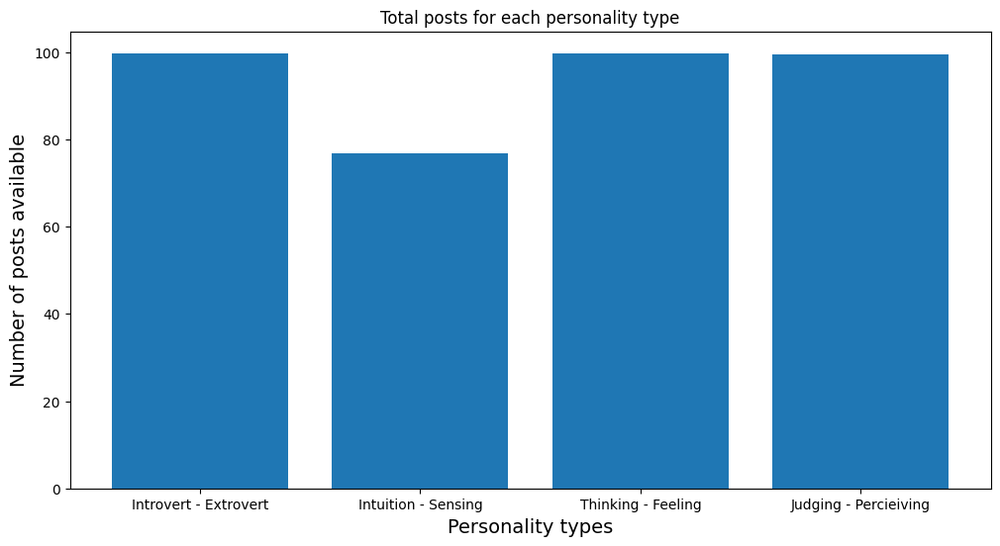

In [ ]:
# Plotting the results for better appeal
plt.figure(figsize = (12,6))
plt.bar(np.array(results.columns), height = results.loc['train'],)
plt.xlabel('Personality types', size = 14)
plt.ylabel('Number of posts available', size = 14)
plt.title('Total posts for each personality type')

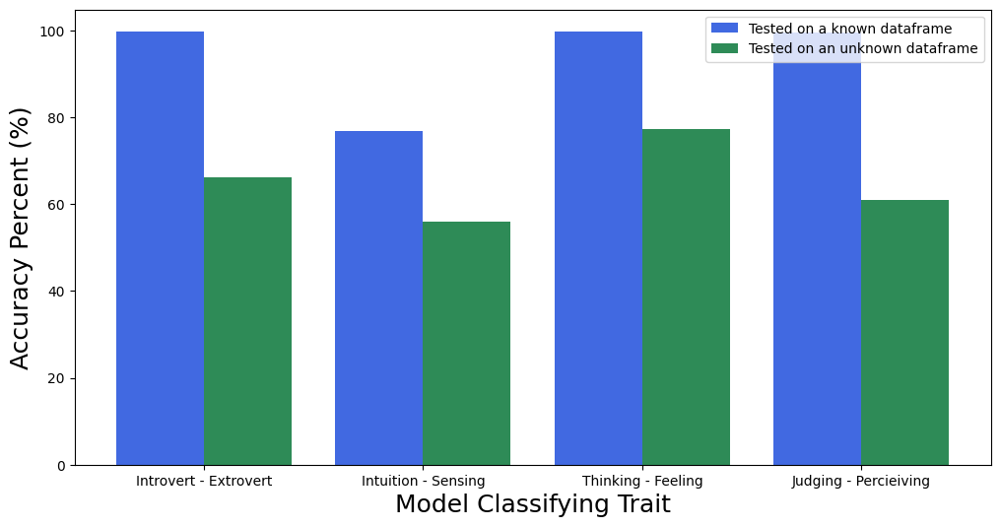

In [ ]:
labels = np.array(results.columns)
training = results.loc['train']
ind = np.arange(4)
width = 0.4
fig = plt.figure()
ax = fig.add_subplot(111)
rects1 = ax.bar(ind, training, width, color='royalblue')

testing = results.loc['test']
rects2 = ax.bar(ind+width, testing, width, color='seagreen')
fig.set_size_inches(12, 6)
fig.savefig('Results.png', dpi=200)

ax.set_xlabel('Model Classifying Trait', size = 18)
ax.set_ylabel('Accuracy Percent (%)', size = 18)
ax.set_xticks(ind + width / 2)
ax.set_xticklabels(labels)
ax.legend((rects1[0], rects2[0]), ('Tested on a known dataframe', 'Tested on an unknown dataframe'))
plt.show()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# Testing the models to predict my trait my feeding few of my quora writings
# link to my quora answers feed: https://www.quora.com/profile/Divya-Bramhecha
# Defining a functions that inputs the writings, tokenizes them and then predicts the output based on our earlier classifiers

def MBTI(input):
    tokenize = build_bag_of_words_features_filtered(input)
    ie = IntroExtro.classify(tokenize)
    Is = IntuitionSensing.classify(tokenize)
    tf = ThinkingFeeling.classify(tokenize)
    jp = JudgingPercieiving.classify(tokenize)

    mbt = ''

    if(ie == 'introvert'):
        mbt+='I'
    if(ie == 'extrovert'):
        mbt+='E'
    if(Is == 'Intuition'):
        mbt+='N'
    if(Is == 'Sensing'):
        mbt+='S'
    if(tf == 'Thinking'):
        mbt+='T'
    if(tf == 'Feeling'):
        mbt+='F'
    if(jp == 'Judging'):
        mbt+='J'
    if(jp == 'Percieving'):
        mbt+='P'
    return(mbt)

In [ ]:
# Building another functions that takes all of my posts as input and outputs the graph showing percentage of each trait seen in each posts and sums up displaying your personality as the graph title
# **Note:** The input should be an array of your posts

def tellmemyMBTI(input, name, traasits=[]):
    a = []
    trait1 = pd.DataFrame([0,0,0,0],['I','N','T','J'],['count'])
    trait2 = pd.DataFrame([0,0,0,0],['E','S','F','P'],['count'])
    for i in input:
        a += [MBTI(i)]
    for i in a:
        for j in ['I','N','T','J']:
            if(j in i):
                trait1.loc[j]+=1
        for j in ['E','S','F','P']:
            if(j in i):
                trait2.loc[j]+=1
    trait1 = trait1.T
    trait1 = trait1*100/len(input)
    trait2 = trait2.T
    trait2 = trait2*100/len(input)


    #Finding the personality
    YourTrait = ''
    for i,j in zip(trait1,trait2):
        temp = max(trait1[i][0],trait2[j][0])
        if(trait1[i][0]==temp):
            YourTrait += i
        if(trait2[j][0]==temp):
            YourTrait += j
    traasits +=[YourTrait]

    #Plotting
    labels = np.array(results.columns)

    intj = trait1.loc['count']
    ind = np.arange(4)
    width = 0.4
    fig = plt.figure()
    ax = fig.add_subplot(111)
    rects1 = ax.bar(ind, intj, width, color='royalblue')

    esfp = trait2.loc['count']
    rects2 = ax.bar(ind+width, esfp, width, color='seagreen')

    fig.set_size_inches(10, 7)



    ax.set_xlabel('Finding the MBTI Trait', size = 18)
    ax.set_ylabel('Trait Percent (%)', size = 18)
    ax.set_xticks(ind + width / 2)
    ax.set_xticklabels(labels)
    ax.set_yticks(np.arange(0,105, step= 10))
    ax.set_title(name+' Your Personality is '+YourTrait,size = 20)
    plt.grid(True)

    plt.show()
    return(traasits)

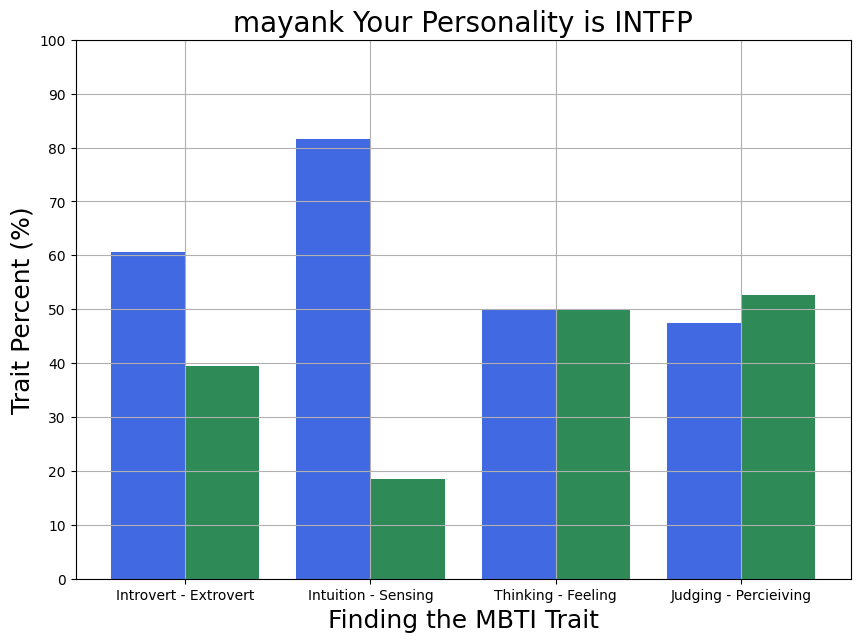

In [ ]:
My_writings = open("/content/poem.txt")
my_writing = My_writings.readlines()
my_posts = my_writing[0].split('|||')
len(my_posts)
#my_posts
# Using the classifier to predict my personality type

trait=tellmemyMBTI(my_posts, 'mayank')

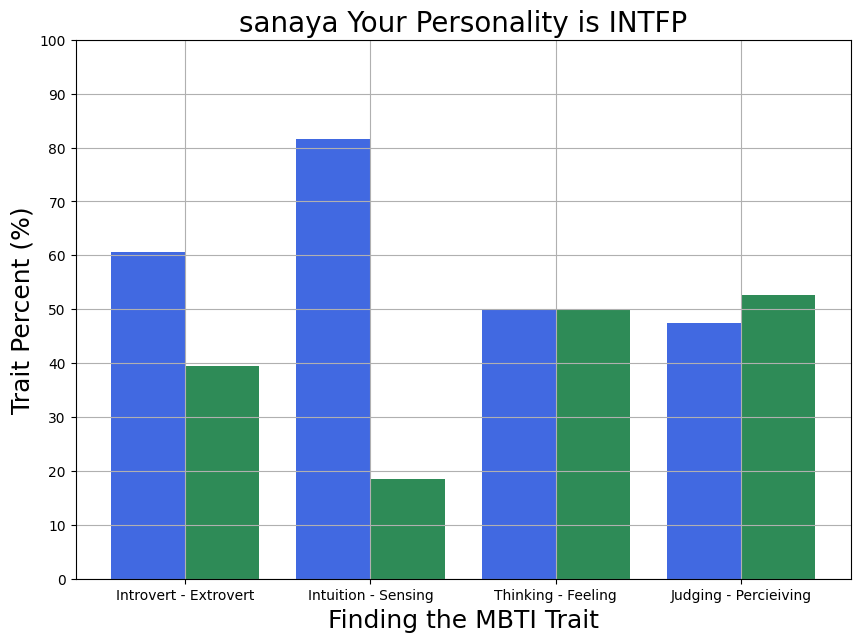

In [ ]:
# Sanaya profile
My_writings = open("/content/poem.txt")
my_writing = My_writings.readlines()
my_posts = my_writing[0].split('|||')
len(my_posts)
#my_posts

trait = tellmemyMBTI(my_posts,'sanaya')